## Week 6 - Session 2: Generative adversarial network (GAN)
* Install package: imageio

* Development environment: 
        cuda 8.0
        Python 3.5.3
        tensorflow-gpu 1.2.1
        numpy 1.13.1
        matplotlib 2.0.2
        imageio 2.2.0

* if you have a later version of tensorflow, there could be deprecation warnings.

"""
Source: https://github.com/znxlwm/tensorflow-MNIST-GAN-DCGAN
"""

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   

import os, time, itertools, imageio, pickle
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import input_data

# in TF there is eager execution or graph execution; despite the name, eager execution is slower than graph execution.
# in TF version 2, by default, eager execution is selected so it is easier for programmers to work with since
# graph execution (by default in TF version 1), was more time-consuming. The swtich from graph execution to 
# eager execution was done to compete with PyTorch's ease-of-use

# some benefits of eager execution is it can be used to get immediate results of operations and is easier to code
# but graph execution allows us to run things more efficiently (e.g., parallel) and the computational graphs can be 
# transferred between devices without the original code
tf.compat.v1.disable_eager_execution()

### Generator & Discriminator
1. What is the role of generator? How does it work? What is the output?
2. What is the role of discriminator? How does it work? What is the output?
3. What can we do with GAN?

In [2]:
# G(z)
def generator(x):
    # the generator will take some noise 'x' and generate/map it to some useful output such as 
    # an image 
    
    # initializers; these are operations that we can create Tensors from, as you can see in subsequent
    # operations with layers, we are initializing the weight matrix and bias vector from these
    # initialize the weight from a normal distribution w/ mean of zero & standard deviation of 0.02
    w_init = tf.compat.v1.initializers.random_normal(mean=0, stddev=0.02)
    # bias is a constant of zero, is not a variable
    b_init = tf.compat.v1.initializers.constant(0.0)

    # 1st hidden layer
    w0 = tf.compat.v1.get_variable('G_w0', [x.get_shape()[1], 256], initializer=w_init)
    b0 = tf.compat.v1.get_variable('G_b0', [256], initializer=b_init)
    h0 = tf.nn.relu(tf.matmul(x, w0) + b0)

    # 2nd hidden layer
    w1 = tf.compat.v1.get_variable('G_w1', [h0.get_shape()[1], 512], initializer=w_init)
    b1 = tf.compat.v1.get_variable('G_b1', [512], initializer=b_init)
    h1 = tf.nn.relu(tf.matmul(h0, w1) + b1)

    # 3rd hidden layer
    w2 = tf.compat.v1.get_variable('G_w2', [h1.get_shape()[1], 1024], initializer=w_init)
    b2 = tf.compat.v1.get_variable('G_b2', [1024], initializer=b_init)
    h2 = tf.nn.relu(tf.matmul(h1, w2) + b2)

    # output hidden layer
    w3 = tf.compat.v1.get_variable('G_w3', [h2.get_shape()[1], 784], initializer=w_init)
    b3 = tf.compat.v1.get_variable('G_b3', [784], initializer=b_init)
    o = tf.nn.tanh(tf.matmul(h2, w3) + b3)

    return o


# D(x)
def discriminator(x, drop_out):
    # the discriminator will take some input 'x' that might be an image and try to detect if it is real or not
    
    # initializers; these are operations that we can create Tensors from, as you can see in subsequent
    # operations with layers, we are initializing the weight matrix and bias vector from these
    # initialize the weight from a normal distribution w/ mean of zero & standard deviation of 0.02
    w_init = tf.compat.v1.initializers.random_normal(mean=0, stddev=0.02)
    # bias is a constant of zero, is not a variable
    b_init = tf.compat.v1.initializers.constant(0.0)

    # 1st hidden layer
    w0 = tf.compat.v1.get_variable('D_w0', [x.get_shape()[1], 1024], initializer=w_init)
    b0 = tf.compat.v1.get_variable('D_b0', [1024], initializer=b_init)
    h0 = tf.nn.relu(tf.matmul(x, w0) + b0)
    h0 = tf.nn.dropout(h0, drop_out)

    # 2nd hidden layer
    w1 = tf.compat.v1.get_variable('D_w1', [h0.get_shape()[1], 512], initializer=w_init)
    b1 = tf.compat.v1.get_variable('D_b1', [512], initializer=b_init)
    h1 = tf.nn.relu(tf.matmul(h0, w1) + b1)
    h1 = tf.nn.dropout(h1, drop_out)

    # 3rd hidden layer
    w2 = tf.compat.v1.get_variable('D_w2', [h1.get_shape()[1], 256], initializer=w_init)
    b2 = tf.compat.v1.get_variable('D_b2', [256], initializer=b_init)
    h2 = tf.nn.relu(tf.matmul(h1, w2) + b2)
    h2 = tf.nn.dropout(h2, drop_out)

    # output layer
    w3 = tf.compat.v1.get_variable('D_w3', [h2.get_shape()[1], 1], initializer=w_init)
    b3 = tf.compat.v1.get_variable('D_b3', [1], initializer=b_init)
    o = tf.sigmoid(tf.matmul(h2, w3) + b3)

    return o

### Functions for showing Training/ Results

In [3]:
fixed_z_ = np.random.normal(0, 1, (25, 100))  # for all epochs, draw from a normal distribution data of shape (25, 100)

# fixed_z will be used to monitor how behavior changes across epochs, where as z_ (defined in the for loop),
# will be used to see how the model is generalizing to new unseen data

def show_result(num_epoch, show = False, save = False, path = 'result.png', isFix=False):
    z_ = np.random.normal(0, 1, (25, 100))  # for this epoch, draw from a normal distribution data of shape (25, 100)

    if isFix:
        # show the performance on the fixed sample
        test_images = sess.run(G_z, {z: fixed_z_, drop_out: 0.0})
    else:
        # show the performance on the randomly drawn sample for this epoch, z_
        test_images = sess.run(G_z, {z: z_, drop_out: 0.0})

    size_figure_grid = 5
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(5, 5))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i, j].get_xaxis().set_visible(False)
        ax[i, j].get_yaxis().set_visible(False)

    for k in range(5*5):
        i = k // 5
        j = k % 5
        ax[i, j].cla()
        ax[i, j].imshow(np.reshape(test_images[k], (28, 28)), cmap='gray')

    label = 'Epoch {0}'.format(num_epoch)
    fig.text(0.5, 0.04, label, ha='center')
    plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

def show_train_hist(hist, show = False, save = False, path = 'Train_hist.png'):
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

### Load Data

In [4]:
# load MNIST
mnist = input_data.read_data_sets("MNIST_data/", one_hot=True)  # old version
train_set = (mnist.train.images - 0.5) / 0.5  # normalization; range: -1 ~ 1

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


### Define GAN: networks, loss function, and optimizer

In [5]:
lr = 0.0002

# networks : generator
with tf.compat.v1.variable_scope('G'):
    z = tf.compat.v1.placeholder(tf.float32, shape=(None, 100))
    G_z = generator(z)

# networks : discriminator
with tf.compat.v1.variable_scope('D') as scope:
    drop_out = tf.compat.v1.placeholder(dtype=tf.float32, name='drop_out')
    x = tf.compat.v1.placeholder(tf.float32, shape=(None, 784))
    D_real = discriminator(x, drop_out)
    scope.reuse_variables()
    D_fake = discriminator(G_z, drop_out)

# we want to carry out adversarial training, the goal of the discriminator is to learn the difference between the 
# real and fake data, in this case, images, and the goal of the generator is to produce convincing data/images

# as such, their objectives are in direct conflict with each other

# loss for each network
eps = 1e-2
# D: maximize D_real and (1-D_fake) (=minimize - log (D_real) - log (1-D_fake)
D_loss = tf.reduce_mean(-tf.math.log(D_real + eps) - tf.math.log(1 - D_fake + eps)) 
# G: maximize the expectation of D_fake
G_loss = tf.reduce_mean(-tf.math.log(D_fake + eps))  

# trainable variables for each network
t_vars = tf.compat.v1.trainable_variables()
D_vars = [var for var in t_vars if 'D_' in var.name]
G_vars = [var for var in t_vars if 'G_' in var.name]

# optimizer for each network
D_optim = tf.compat.v1.train.AdamOptimizer(lr).minimize(D_loss, var_list=D_vars)
G_optim = tf.compat.v1.train.AdamOptimizer(lr).minimize(G_loss, var_list=G_vars)

### GPU setting
 - NVIDIA GPU example

In [ ]:
# open session and initialize all variables

if True: # If you have multiple GPUs, setup GPU
    os.environ['TF_CPP_MIN_LOG_LEVEL']='2'            # Ignore detailed log massages for GPU
    os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"    # the IDs match nvidia-smi
    os.environ["CUDA_VISIBLE_DEVICES"] = '0'          # GPU-ID "0" or "0, 1" for multiple
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.per_process_gpu_memory_fraction = 0.5 
    # config.gpu_options.allow_growth = True 
    
    sess = tf.compat.v1.InteractiveSession(config=config)
else:
    sess = tf.compat.v1.InteractiveSession()

### GAN Training
- Review the given output for discussion. The given output was generated with 100 epochs.
- Please do not wait to finish training GAN during the workshop. It took ~12 min to train 100 epochs with a GPU (Titan XP). 
- When training it, you may reduce the training epoch. 

[1/100] - ptime: 5.60 loss_d: 0.443, loss_g: 2.591


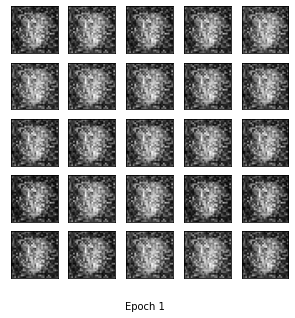

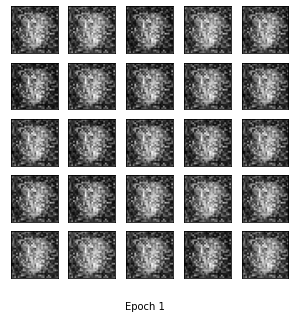

[2/100] - ptime: 5.11 loss_d: 0.113, loss_g: 4.127


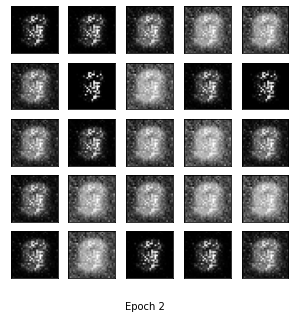

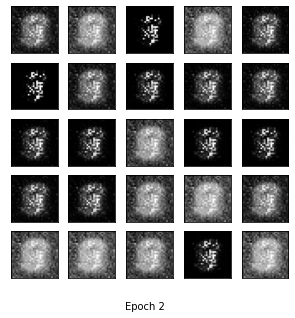

[3/100] - ptime: 5.41 loss_d: 0.038, loss_g: 4.224


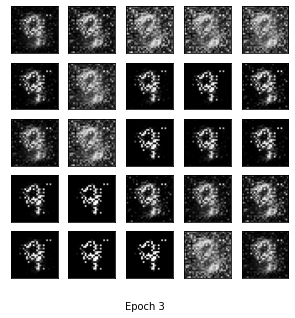

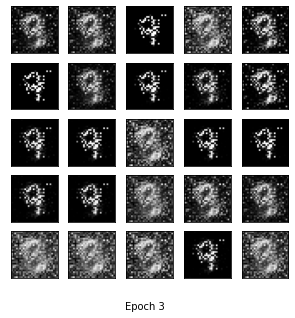

[4/100] - ptime: 5.15 loss_d: 0.080, loss_g: 4.249


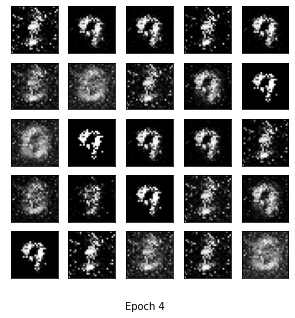

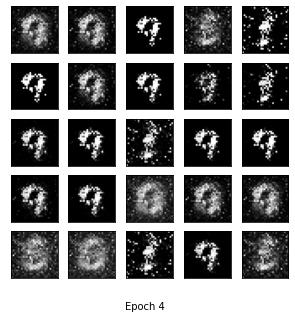

[5/100] - ptime: 4.95 loss_d: 0.065, loss_g: 4.288


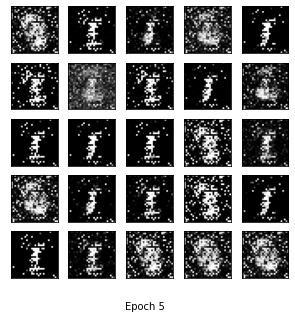

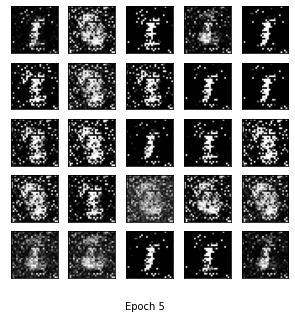

[6/100] - ptime: 4.18 loss_d: 0.018, loss_g: 4.511


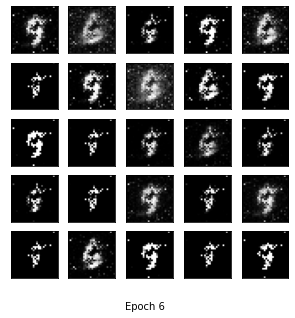

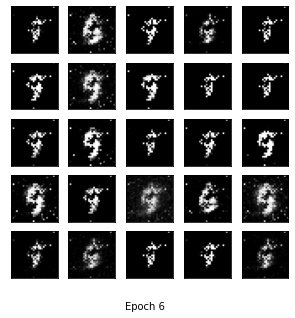

[7/100] - ptime: 4.64 loss_d: 0.108, loss_g: 4.136


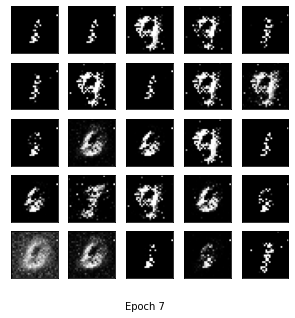

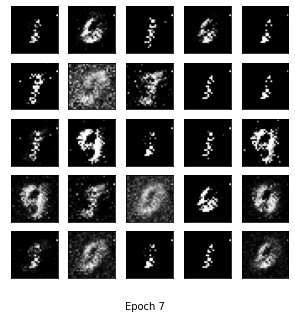

[8/100] - ptime: 4.28 loss_d: 0.188, loss_g: 3.775


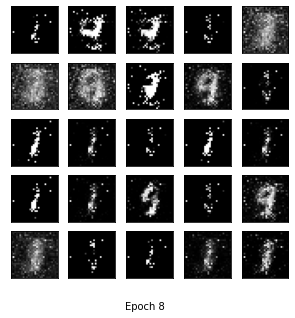

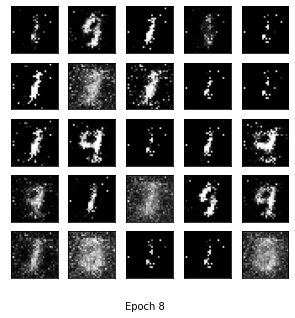

[9/100] - ptime: 4.40 loss_d: 0.262, loss_g: 3.523


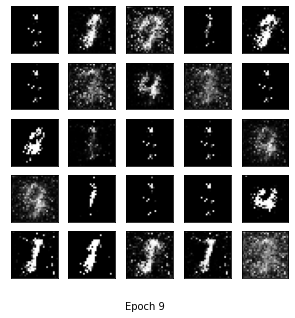

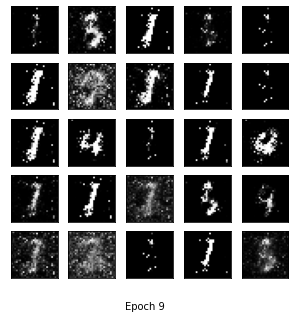

[10/100] - ptime: 4.60 loss_d: 0.303, loss_g: 3.244


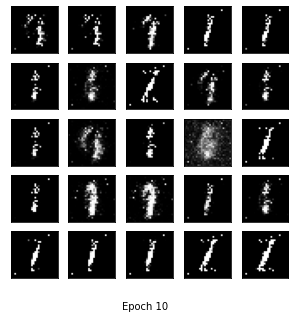

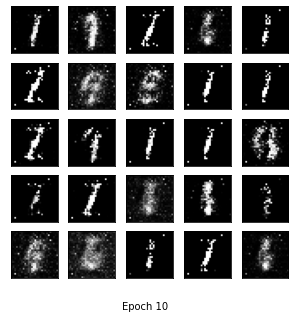

[11/100] - ptime: 4.86 loss_d: 0.378, loss_g: 2.944


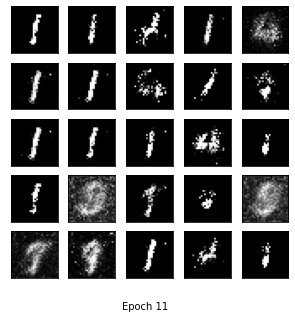

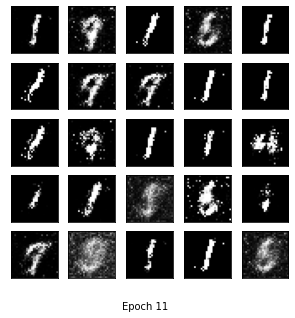

[12/100] - ptime: 4.27 loss_d: 0.366, loss_g: 2.916


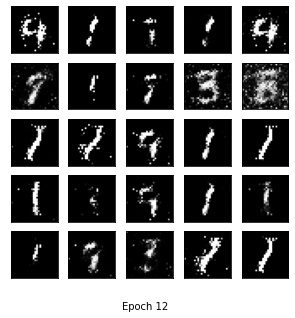

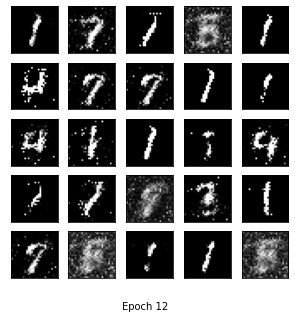

[13/100] - ptime: 4.55 loss_d: 0.428, loss_g: 2.730


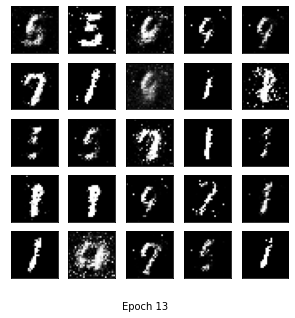

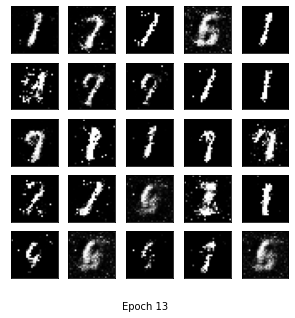

[14/100] - ptime: 4.95 loss_d: 0.481, loss_g: 2.478


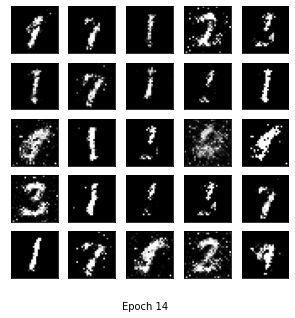

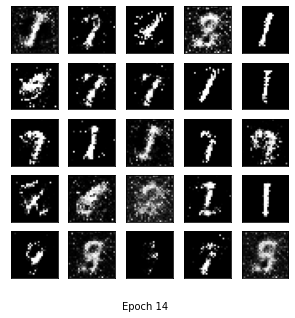

[15/100] - ptime: 4.66 loss_d: 0.562, loss_g: 2.246


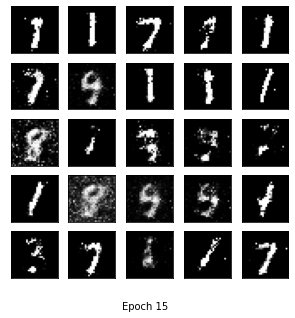

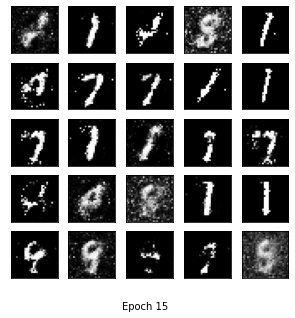

[16/100] - ptime: 4.17 loss_d: 0.600, loss_g: 2.046


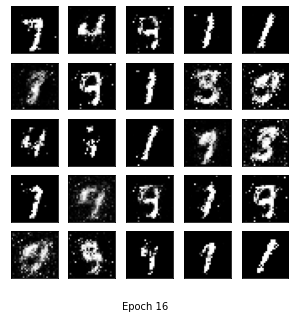

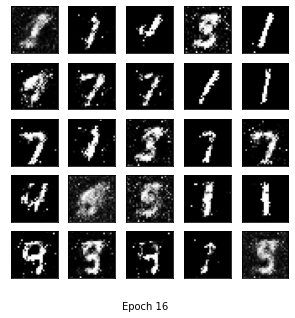

[17/100] - ptime: 4.36 loss_d: 0.675, loss_g: 1.897


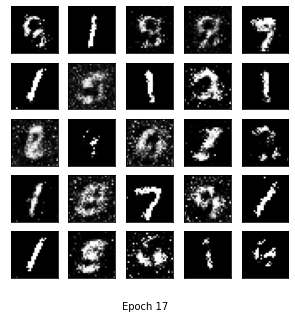

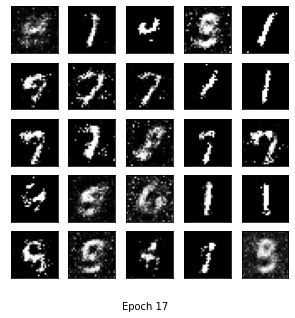

[18/100] - ptime: 4.86 loss_d: 0.712, loss_g: 1.768


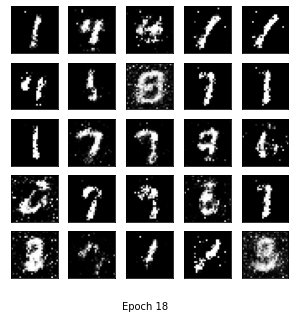

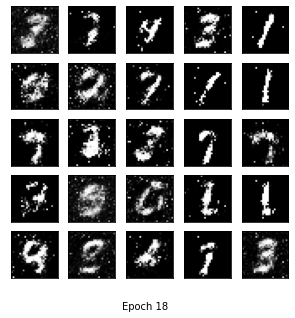

[19/100] - ptime: 4.58 loss_d: 0.741, loss_g: 1.717


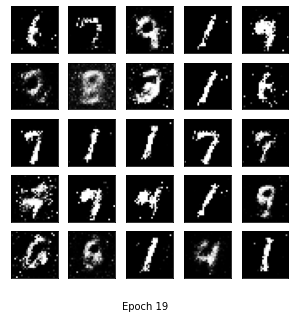

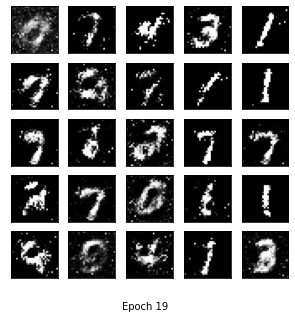

[20/100] - ptime: 4.41 loss_d: 0.761, loss_g: 1.668


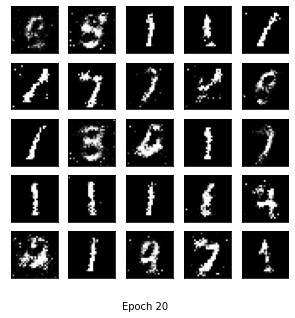

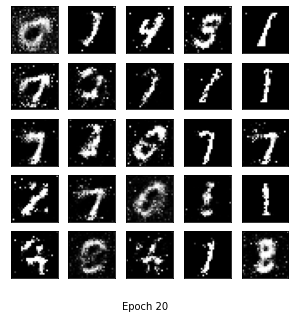

[21/100] - ptime: 4.08 loss_d: 0.777, loss_g: 1.690


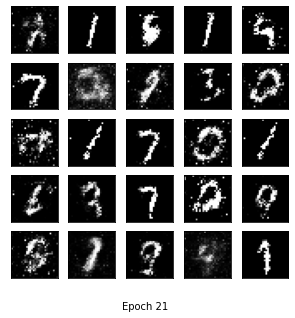

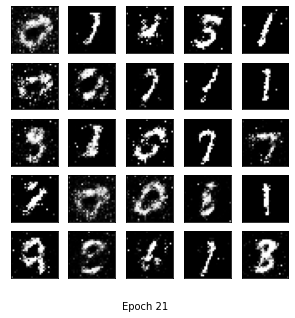

[22/100] - ptime: 4.16 loss_d: 0.861, loss_g: 1.483


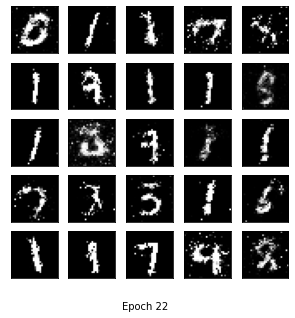

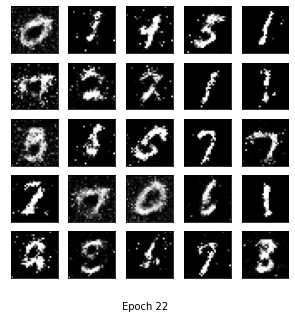

[23/100] - ptime: 4.42 loss_d: 0.898, loss_g: 1.379


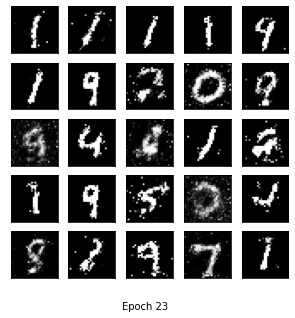

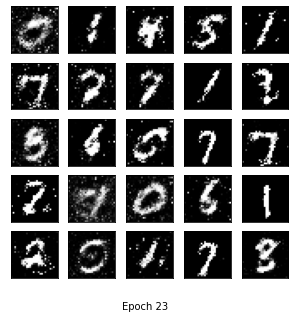

[24/100] - ptime: 5.20 loss_d: 0.914, loss_g: 1.350


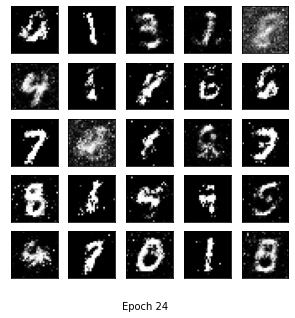

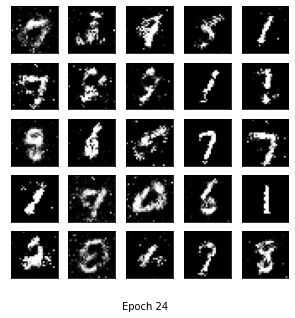

[25/100] - ptime: 3.65 loss_d: 0.929, loss_g: 1.323


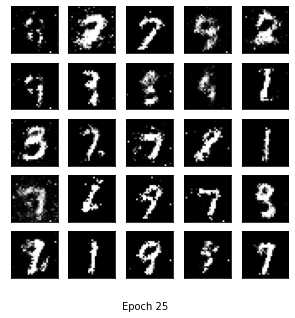

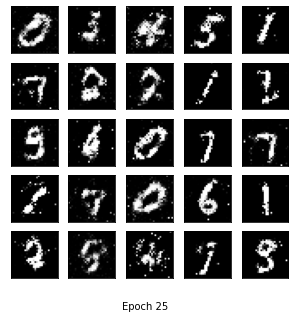

[26/100] - ptime: 4.23 loss_d: 0.961, loss_g: 1.289


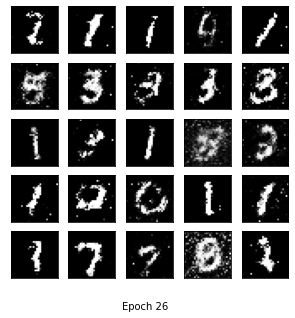

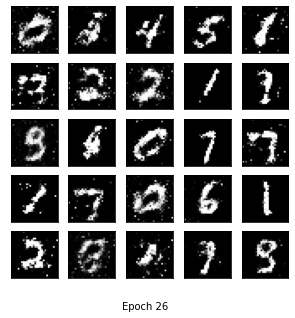

[27/100] - ptime: 4.42 loss_d: 0.962, loss_g: 1.275


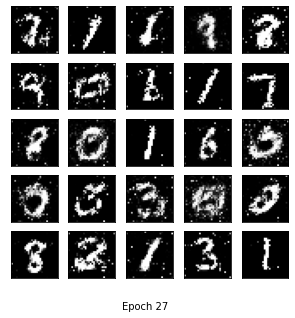

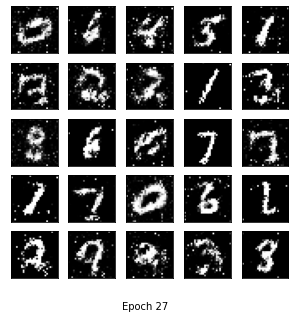

[28/100] - ptime: 4.68 loss_d: 0.968, loss_g: 1.285


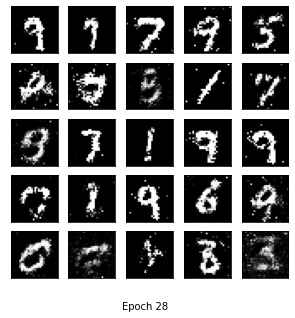

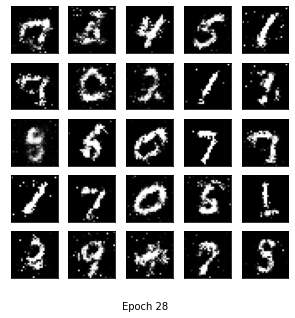

[29/100] - ptime: 4.81 loss_d: 0.997, loss_g: 1.211


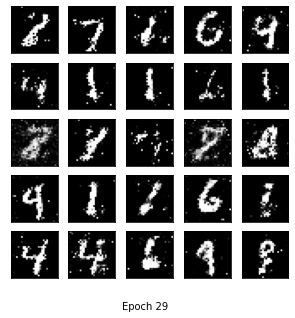

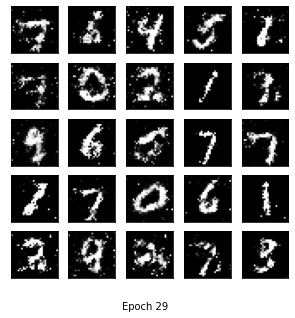

[30/100] - ptime: 4.35 loss_d: 1.011, loss_g: 1.194


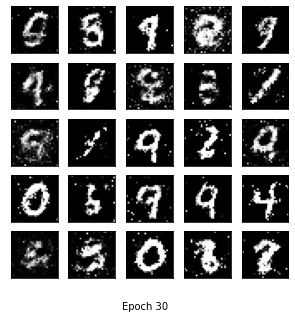

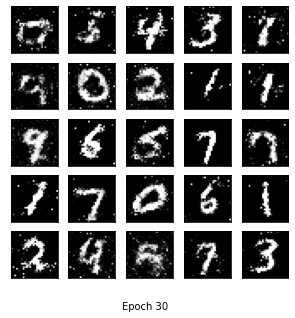

[31/100] - ptime: 4.28 loss_d: 1.020, loss_g: 1.171


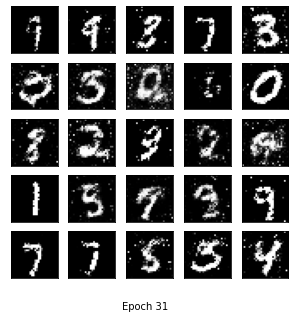

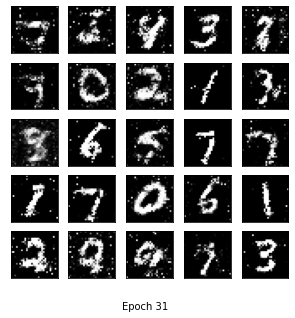

[32/100] - ptime: 3.86 loss_d: 1.017, loss_g: 1.188


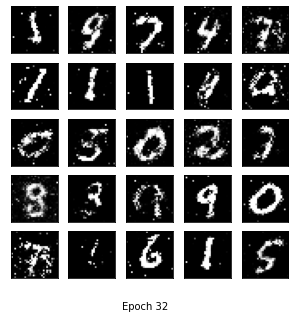

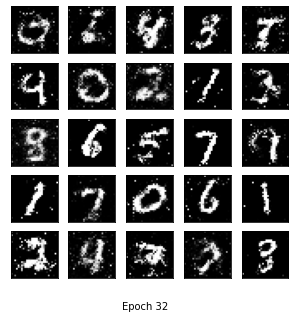

[33/100] - ptime: 4.14 loss_d: 1.071, loss_g: 1.097


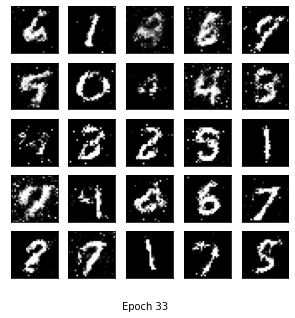

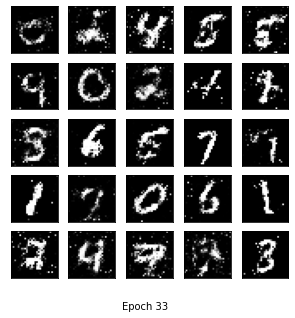

[34/100] - ptime: 4.51 loss_d: 1.056, loss_g: 1.129


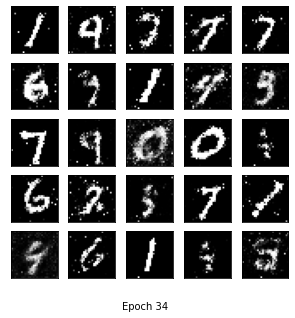

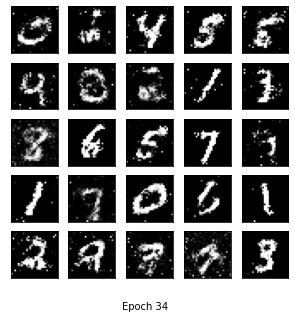

[35/100] - ptime: 4.41 loss_d: 1.069, loss_g: 1.092


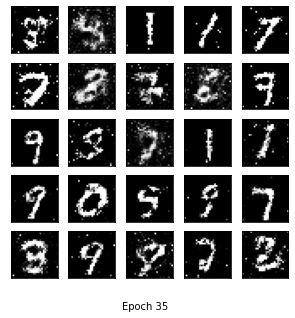

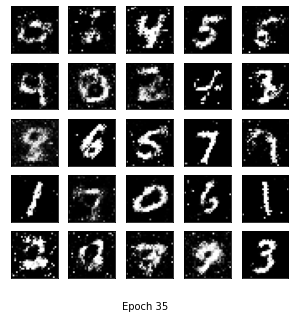

[36/100] - ptime: 4.41 loss_d: 1.071, loss_g: 1.082


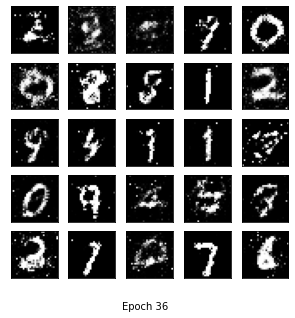

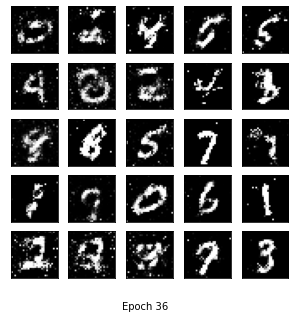

[37/100] - ptime: 4.08 loss_d: 1.075, loss_g: 1.087


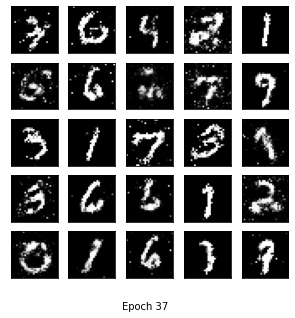

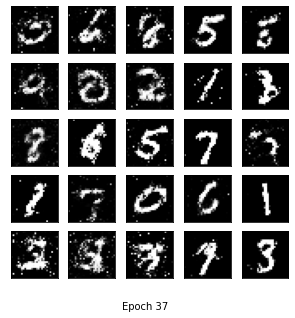

[38/100] - ptime: 4.34 loss_d: 1.092, loss_g: 1.053


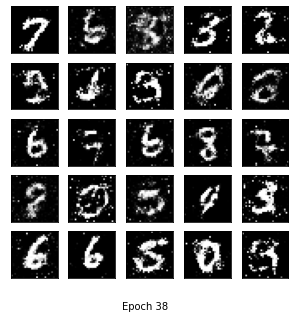

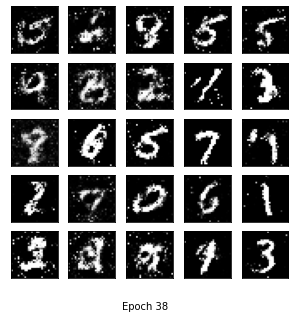

[39/100] - ptime: 3.80 loss_d: 1.118, loss_g: 1.032


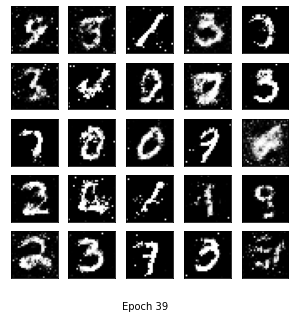

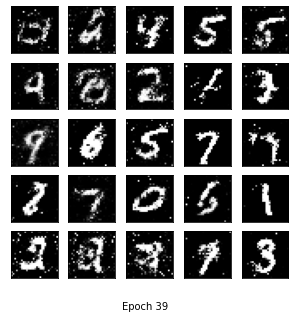

[40/100] - ptime: 3.28 loss_d: 1.126, loss_g: 1.012


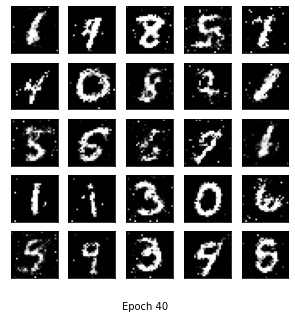

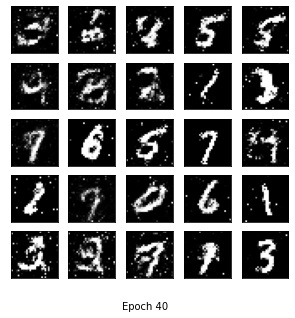

[41/100] - ptime: 4.52 loss_d: 1.123, loss_g: 1.024


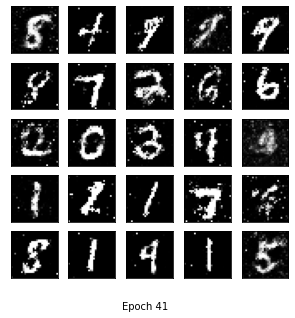

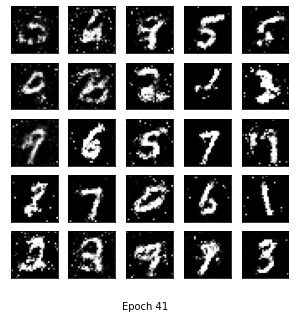

[42/100] - ptime: 4.20 loss_d: 1.135, loss_g: 1.010


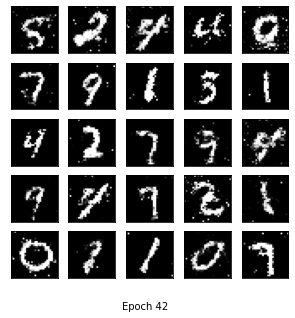

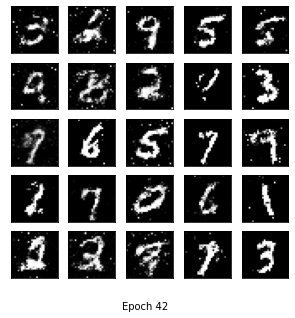

[43/100] - ptime: 4.30 loss_d: 1.148, loss_g: 0.986


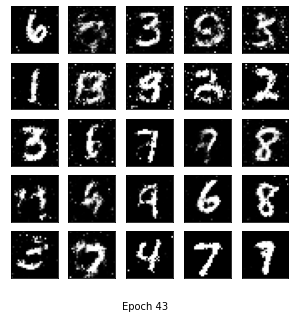

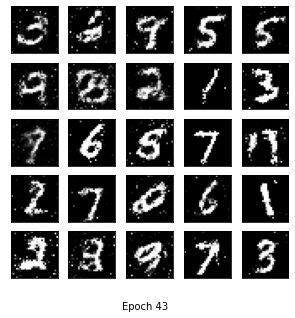

[44/100] - ptime: 4.32 loss_d: 1.157, loss_g: 0.958


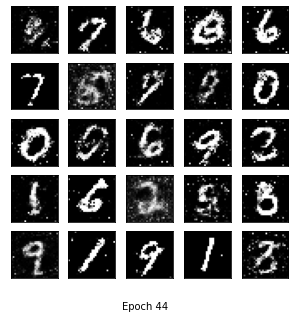

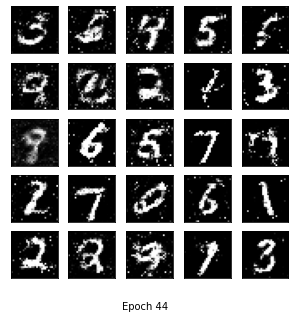

[45/100] - ptime: 4.72 loss_d: 1.153, loss_g: 0.975


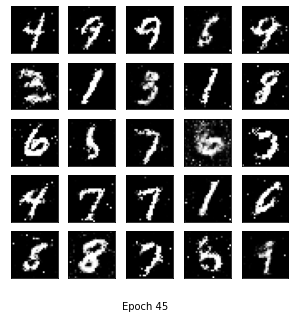

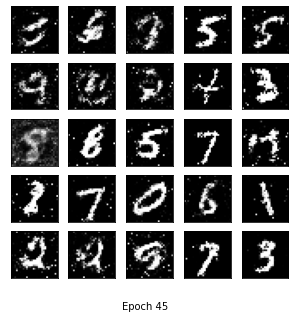

[46/100] - ptime: 4.72 loss_d: 1.159, loss_g: 0.972


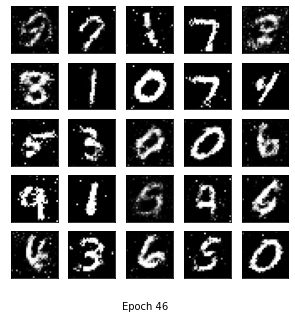

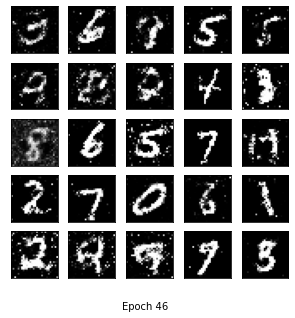

[47/100] - ptime: 4.55 loss_d: 1.167, loss_g: 0.948


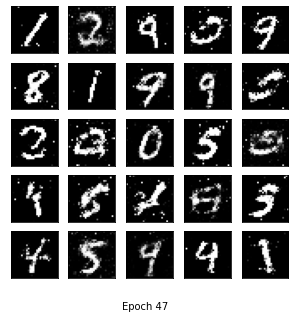

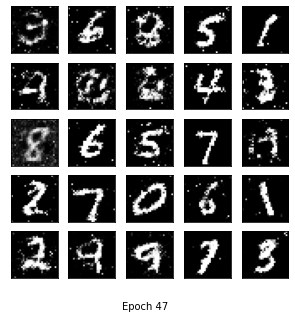

[48/100] - ptime: 4.66 loss_d: 1.156, loss_g: 0.961


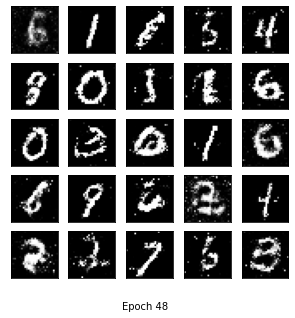

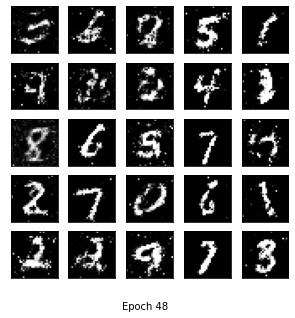

[49/100] - ptime: 4.65 loss_d: 1.163, loss_g: 0.951


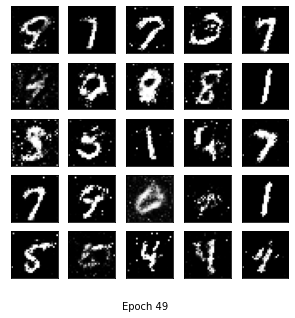

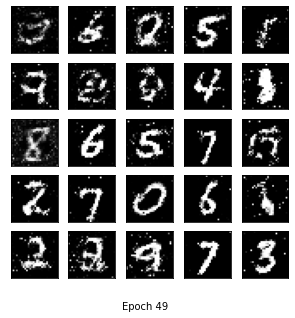

[50/100] - ptime: 4.52 loss_d: 1.167, loss_g: 0.949


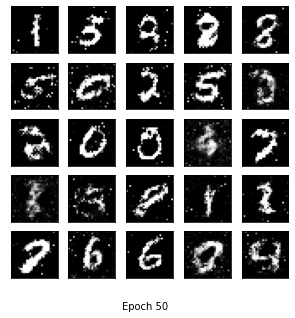

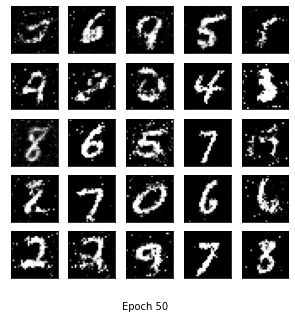

[51/100] - ptime: 4.51 loss_d: 1.163, loss_g: 0.954


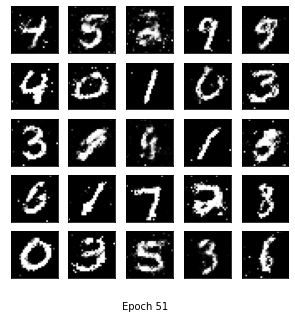

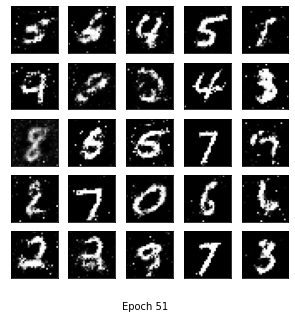

[52/100] - ptime: 4.89 loss_d: 1.172, loss_g: 0.945


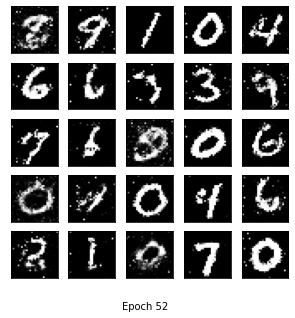

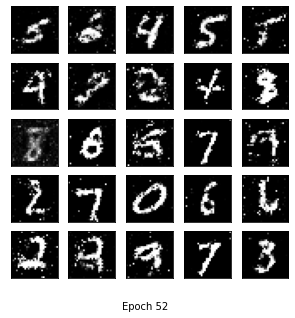

[53/100] - ptime: 4.99 loss_d: 1.173, loss_g: 0.938


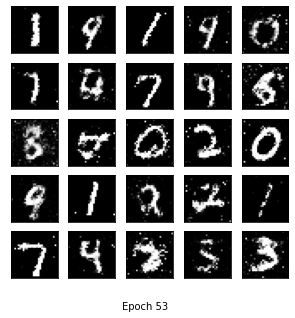

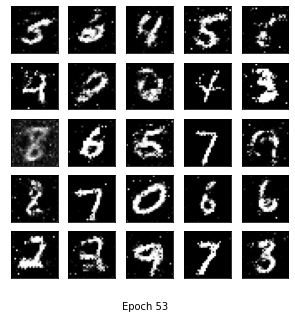

[54/100] - ptime: 4.43 loss_d: 1.176, loss_g: 0.932


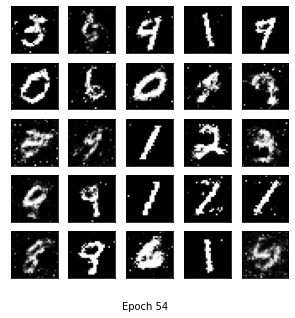

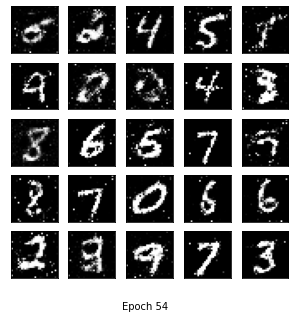

[55/100] - ptime: 4.01 loss_d: 1.184, loss_g: 0.929


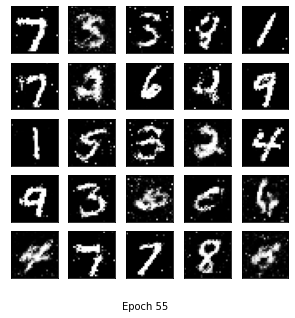

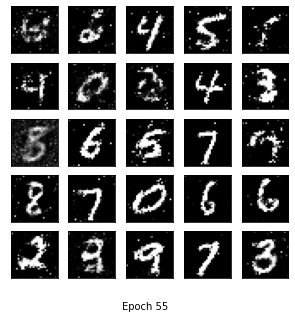

[56/100] - ptime: 4.15 loss_d: 1.178, loss_g: 0.938


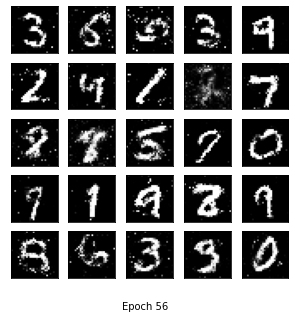

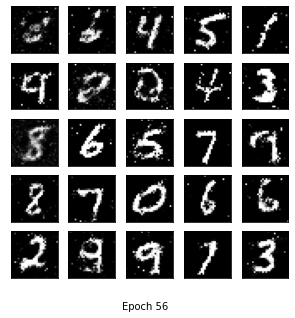

[57/100] - ptime: 4.31 loss_d: 1.184, loss_g: 0.923


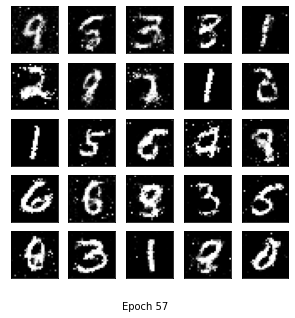

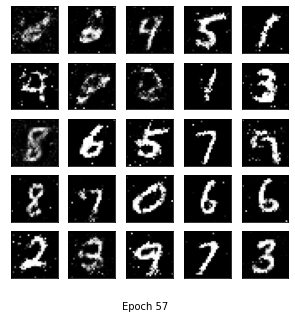

[58/100] - ptime: 4.29 loss_d: 1.183, loss_g: 0.923


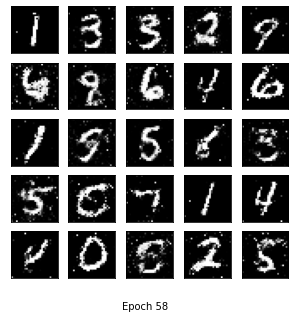

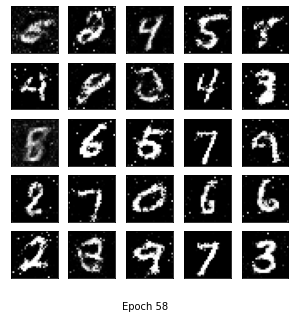

[59/100] - ptime: 4.55 loss_d: 1.191, loss_g: 0.915


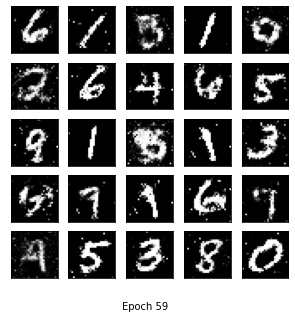

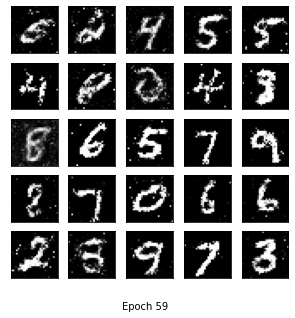

[60/100] - ptime: 4.45 loss_d: 1.195, loss_g: 0.909


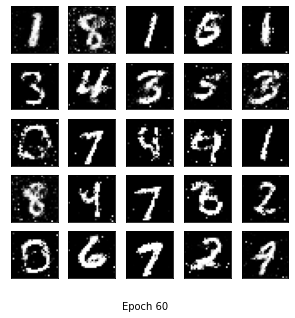

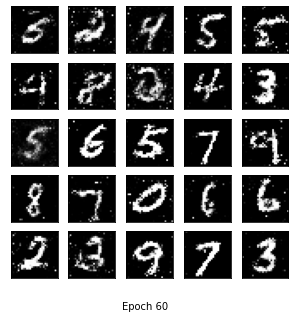

[61/100] - ptime: 4.35 loss_d: 1.203, loss_g: 0.894


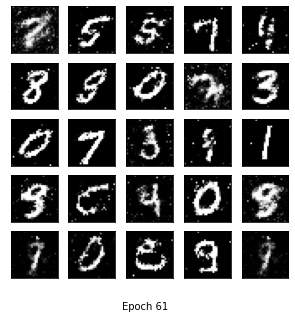

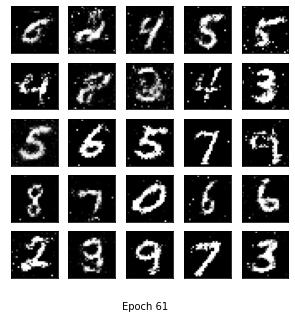

[62/100] - ptime: 4.94 loss_d: 1.201, loss_g: 0.899


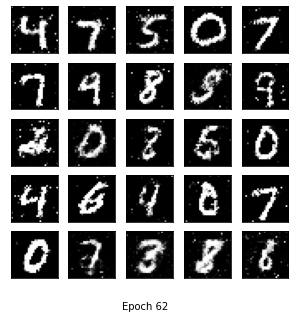

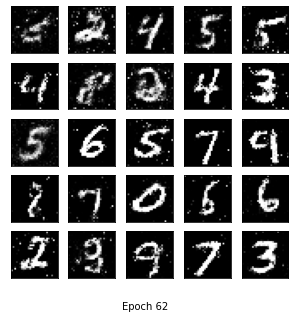

[63/100] - ptime: 4.51 loss_d: 1.202, loss_g: 0.887


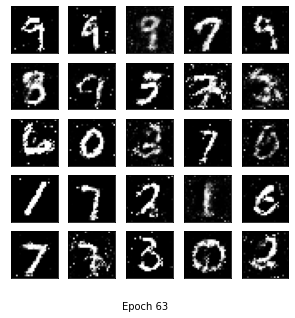

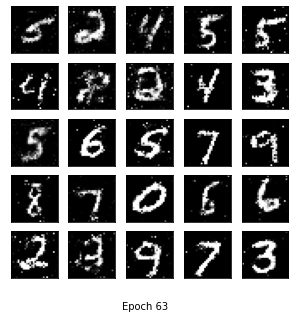

[64/100] - ptime: 4.00 loss_d: 1.195, loss_g: 0.906


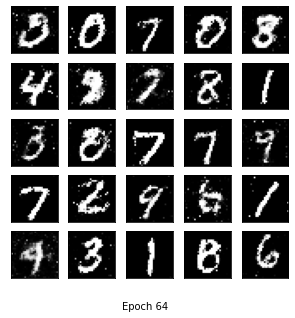

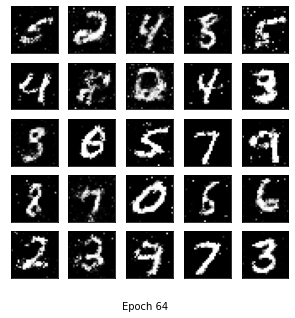

[65/100] - ptime: 4.89 loss_d: 1.205, loss_g: 0.891


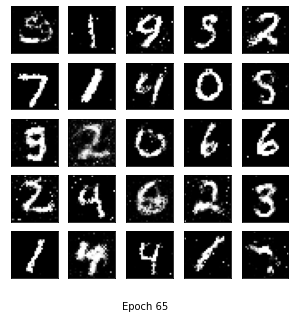

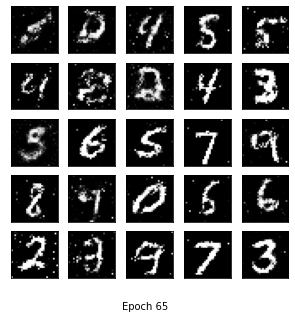

[66/100] - ptime: 4.98 loss_d: 1.196, loss_g: 0.910


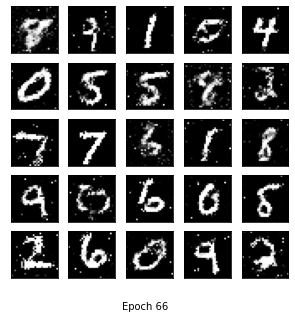

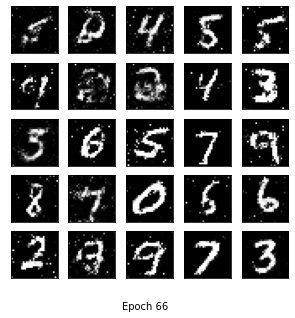

[67/100] - ptime: 4.87 loss_d: 1.207, loss_g: 0.886


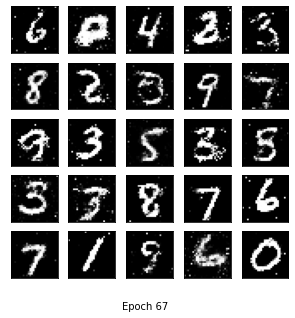

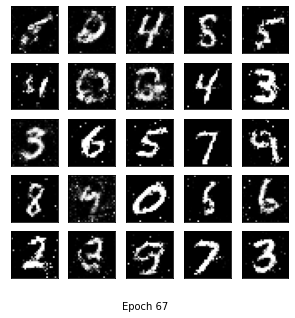

[68/100] - ptime: 3.96 loss_d: 1.214, loss_g: 0.878


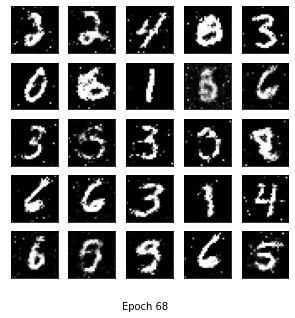

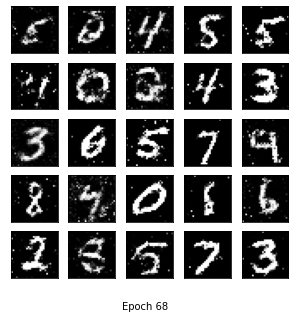

[69/100] - ptime: 3.94 loss_d: 1.210, loss_g: 0.884


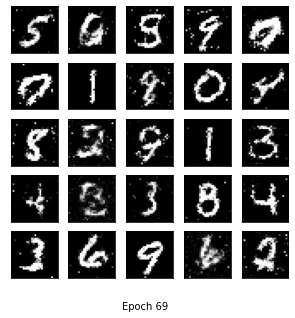

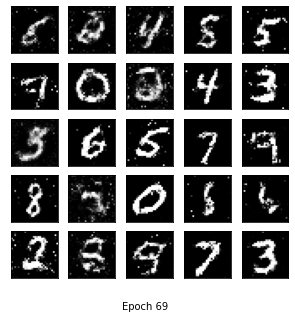

[70/100] - ptime: 4.69 loss_d: 1.202, loss_g: 0.888


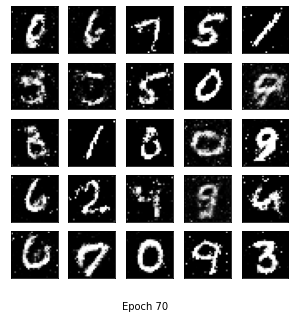

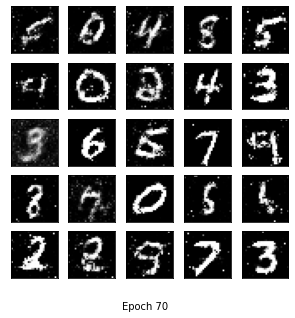

[71/100] - ptime: 3.87 loss_d: 1.215, loss_g: 0.872


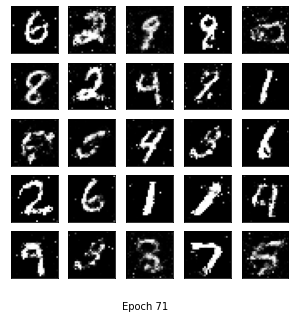

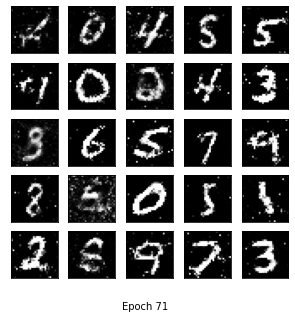

[72/100] - ptime: 4.57 loss_d: 1.218, loss_g: 0.867


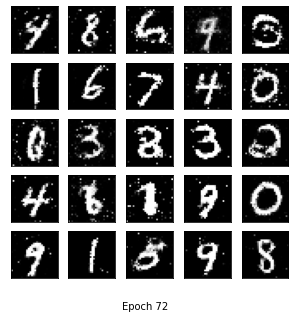

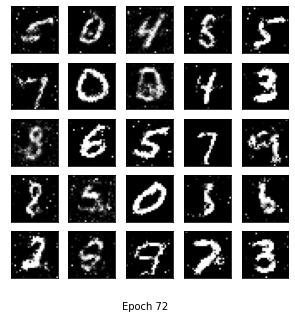

[73/100] - ptime: 4.71 loss_d: 1.213, loss_g: 0.875


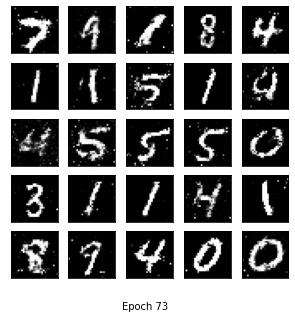

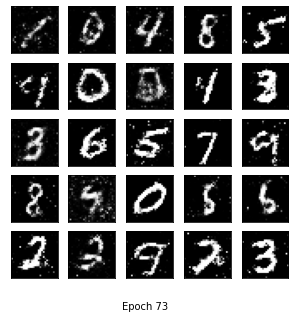

[74/100] - ptime: 4.42 loss_d: 1.218, loss_g: 0.863


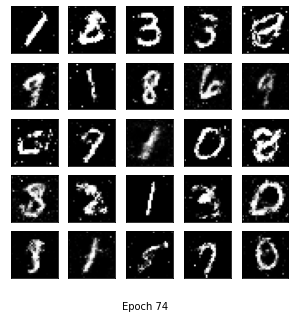

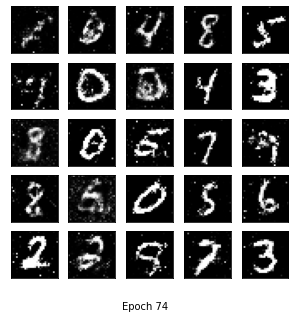

[75/100] - ptime: 4.46 loss_d: 1.217, loss_g: 0.868


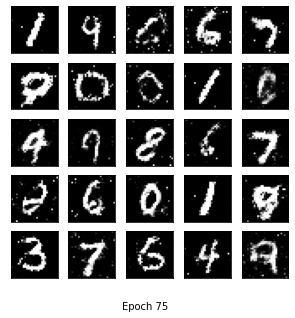

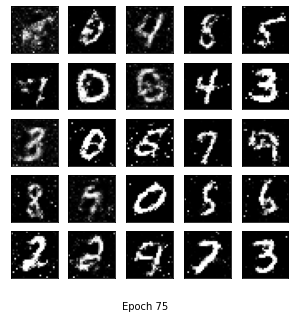

[76/100] - ptime: 4.18 loss_d: 1.226, loss_g: 0.853


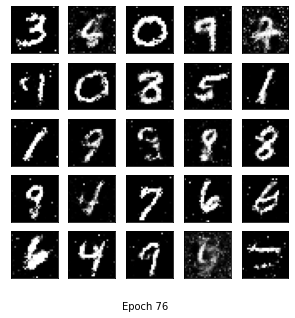

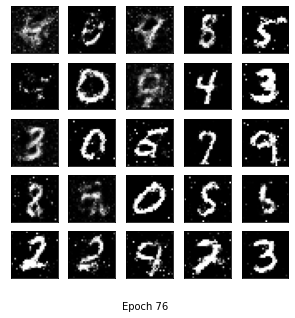

[77/100] - ptime: 4.21 loss_d: 1.228, loss_g: 0.857


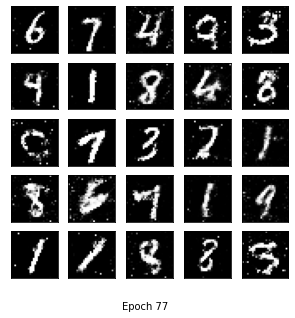

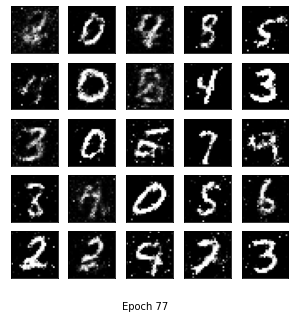

[78/100] - ptime: 4.65 loss_d: 1.221, loss_g: 0.865


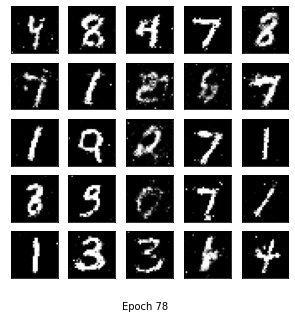

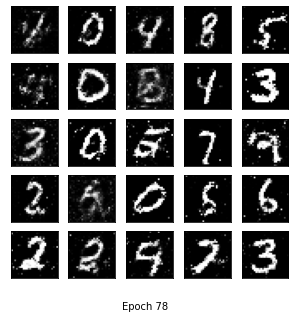

[79/100] - ptime: 4.54 loss_d: 1.228, loss_g: 0.852


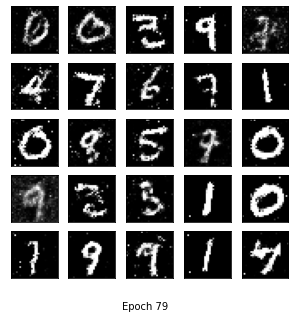

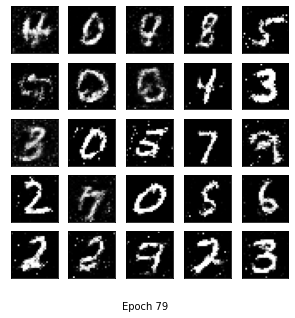

[80/100] - ptime: 4.53 loss_d: 1.228, loss_g: 0.850


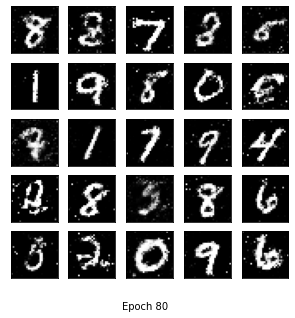

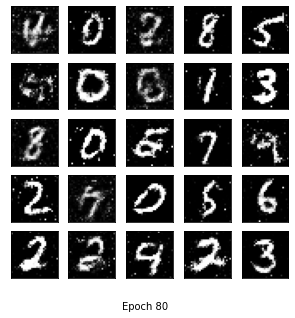

[81/100] - ptime: 5.28 loss_d: 1.226, loss_g: 0.858


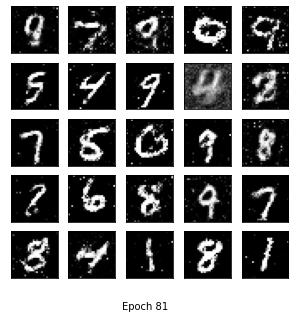

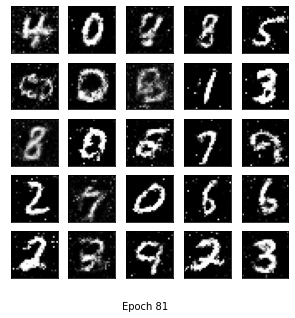

[82/100] - ptime: 5.22 loss_d: 1.223, loss_g: 0.866


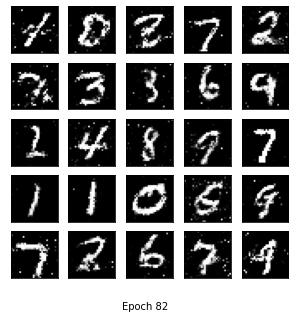

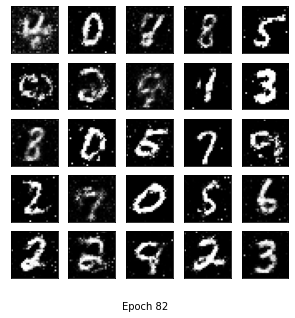

[83/100] - ptime: 4.87 loss_d: 1.224, loss_g: 0.860


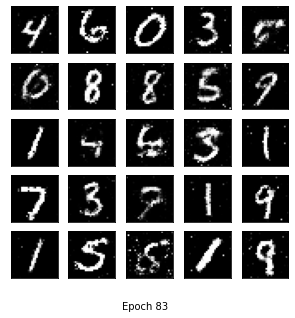

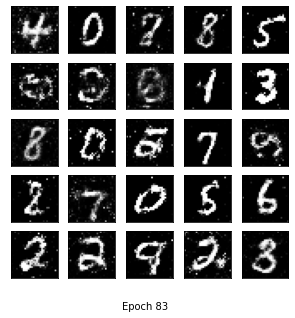

[84/100] - ptime: 3.95 loss_d: 1.219, loss_g: 0.860


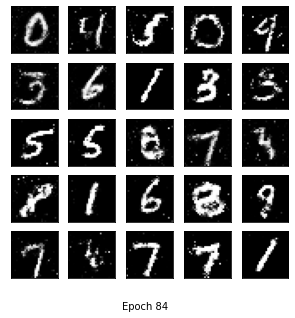

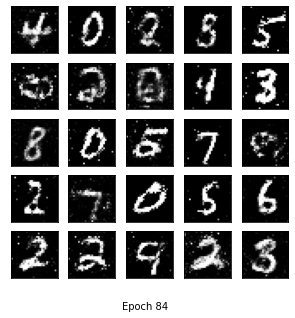

[85/100] - ptime: 4.28 loss_d: 1.225, loss_g: 0.861


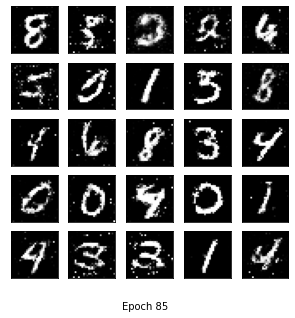

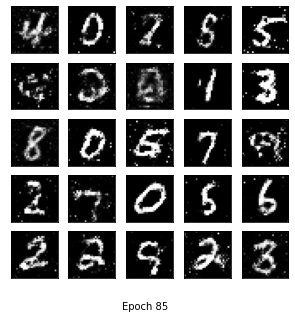

[86/100] - ptime: 4.43 loss_d: 1.229, loss_g: 0.848


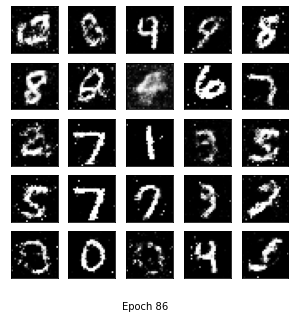

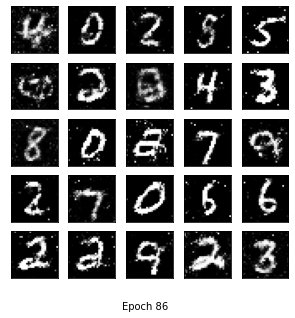

[87/100] - ptime: 3.76 loss_d: 1.226, loss_g: 0.860


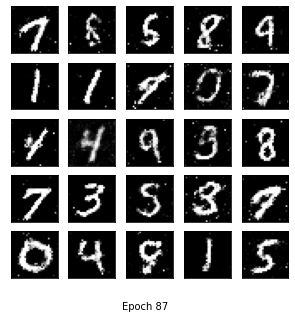

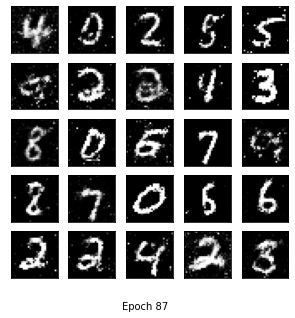

[88/100] - ptime: 5.04 loss_d: 1.233, loss_g: 0.848


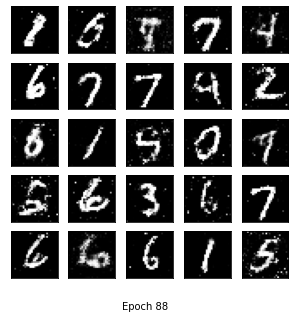

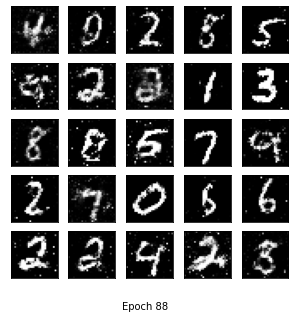

[89/100] - ptime: 4.75 loss_d: 1.236, loss_g: 0.842


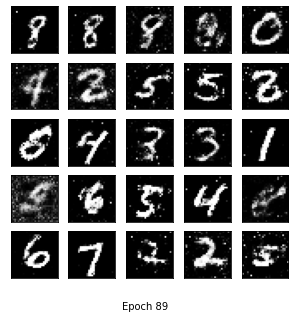

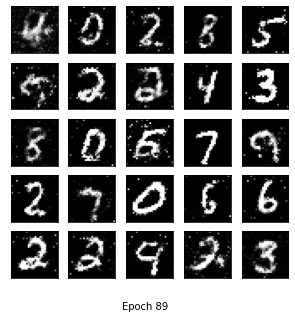

[90/100] - ptime: 4.16 loss_d: 1.234, loss_g: 0.844


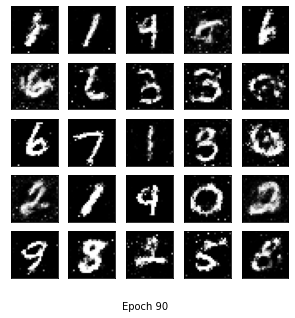

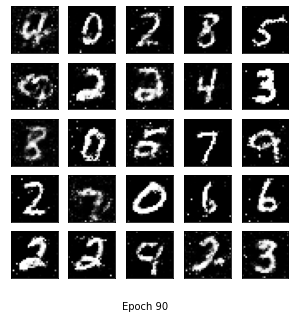

[91/100] - ptime: 4.66 loss_d: 1.234, loss_g: 0.848


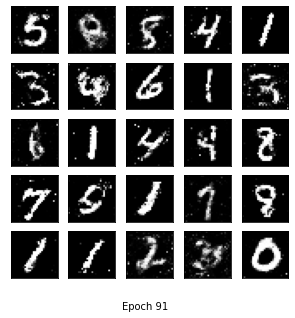

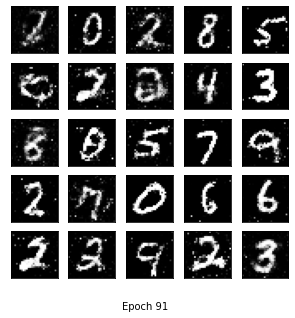

[92/100] - ptime: 4.35 loss_d: 1.237, loss_g: 0.838


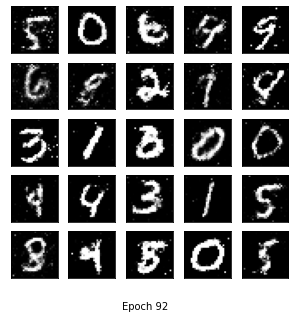

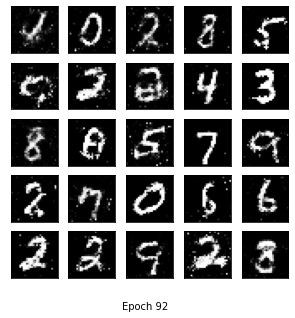

[93/100] - ptime: 5.06 loss_d: 1.237, loss_g: 0.837


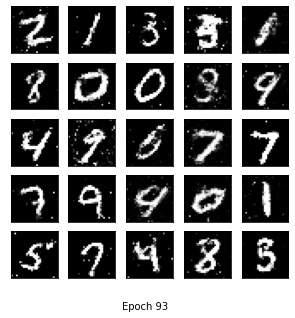

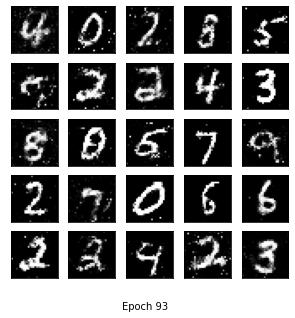

[94/100] - ptime: 4.35 loss_d: 1.232, loss_g: 0.846


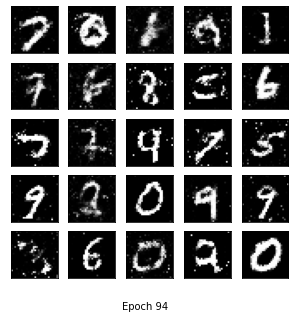

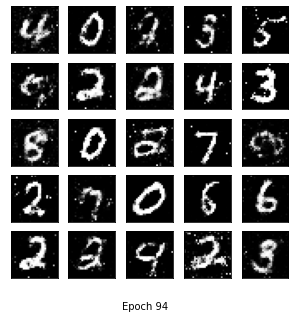

[95/100] - ptime: 4.61 loss_d: 1.230, loss_g: 0.849


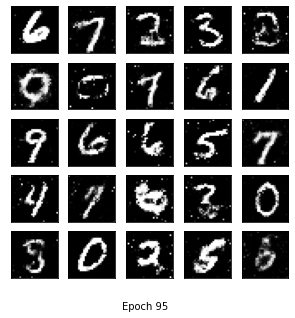

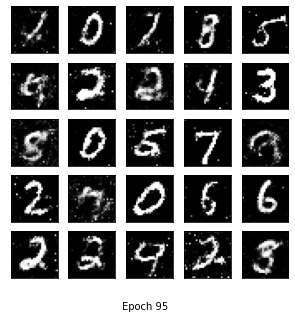

[96/100] - ptime: 4.87 loss_d: 1.234, loss_g: 0.853


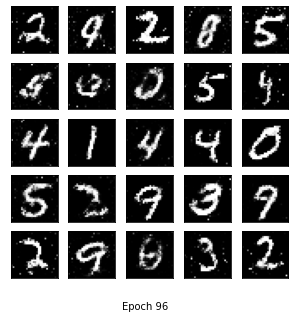

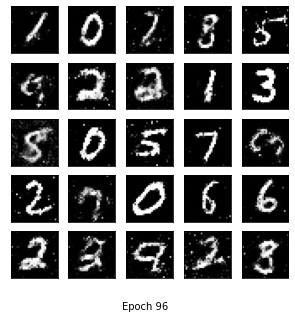

[97/100] - ptime: 4.86 loss_d: 1.236, loss_g: 0.840


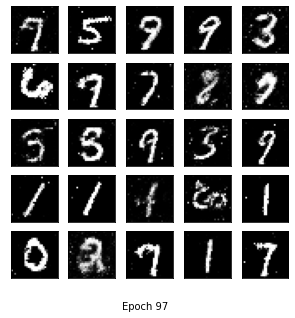

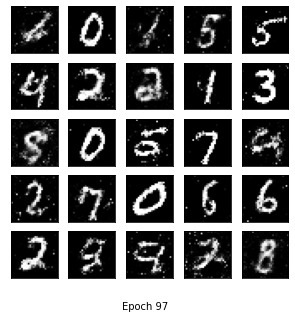

[98/100] - ptime: 4.54 loss_d: 1.231, loss_g: 0.850


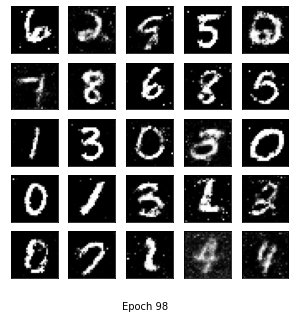

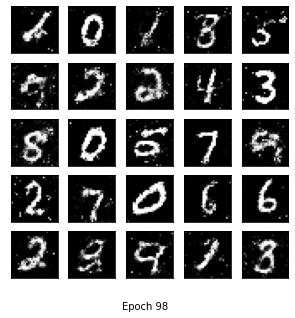

[99/100] - ptime: 4.09 loss_d: 1.233, loss_g: 0.841


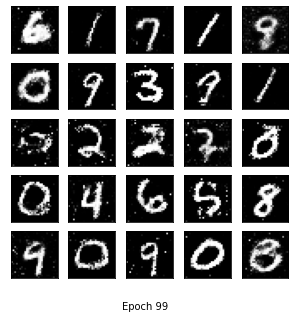

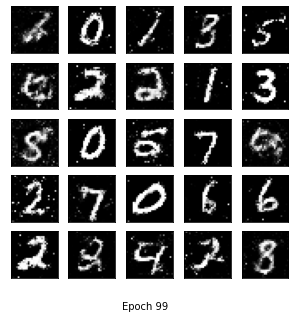

[100/100] - ptime: 4.68 loss_d: 1.234, loss_g: 0.848


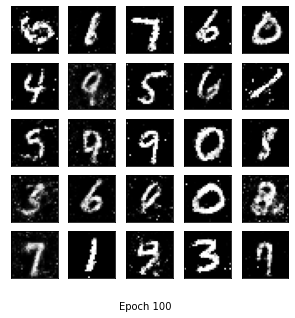

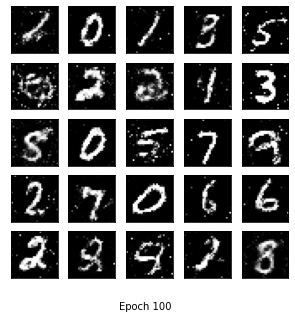

Avg per epoch ptime: 4.50, total 100 epochs ptime: 746.36
Training finish!... save training results


In [10]:
# training parameters
batch_size = 100
train_epoch = 40  # !!!!! The below results were generated with 100 epochs

tf.compat.v1.global_variables_initializer().run()

# results save folder
if not os.path.isdir('MNIST_GAN_results'):
    os.mkdir('MNIST_GAN_results')
if not os.path.isdir('MNIST_GAN_results/Random_results'):
    os.mkdir('MNIST_GAN_results/Random_results')
if not os.path.isdir('MNIST_GAN_results/Fixed_results'):
    os.mkdir('MNIST_GAN_results/Fixed_results')

train_hist = {}
train_hist['D_losses'] = []
train_hist['G_losses'] = []
train_hist['per_epoch_ptimes'] = []
train_hist['total_ptime'] = []

# training-loop
np.random.seed(int(time.time()))
start_time = time.time()
for epoch in range(train_epoch):
    G_losses = []
    D_losses = []
    epoch_start_time = time.time()
    for iter in range(train_set.shape[0] // batch_size):
        
        # update discriminator
        x_ = train_set[iter*batch_size:(iter+1)*batch_size]
        # x_ = x_.reshape([x_.shape[0],-1])

        z_ = np.random.normal(0, 1, (batch_size, 100))

        loss_d_, _ = sess.run([D_loss, D_optim], {x: x_, z: z_, drop_out: 0.3})
        D_losses.append(loss_d_)

        # update generator
        z_ = np.random.normal(0, 1, (batch_size, 100))
        loss_g_, _ = sess.run([G_loss, G_optim], {z: z_, drop_out: 0.3})
        G_losses.append(loss_g_)

    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time
    print('[%d/%d] - ptime: %.2f loss_d: %.3f, loss_g: %.3f' % ((epoch + 1), train_epoch, per_epoch_ptime, np.mean(D_losses), np.mean(G_losses)))
    p = 'MNIST_GAN_results/Random_results/MNIST_GAN_' + str(epoch + 1) + '.png'
    fixed_p = 'MNIST_GAN_results/Fixed_results/MNIST_GAN_' + str(epoch + 1) + '.png'
    show_result((epoch + 1), show=True, save=False, path=p, isFix=False)
    show_result((epoch + 1), show=True, save=False, path=fixed_p, isFix=True)
    train_hist['D_losses'].append(np.mean(D_losses))
    train_hist['G_losses'].append(np.mean(G_losses))
    train_hist['per_epoch_ptimes'].append(per_epoch_ptime)

end_time = time.time()
total_ptime = end_time - start_time
train_hist['total_ptime'].append(total_ptime)

print('Avg per epoch ptime: %.2f, total %d epochs ptime: %.2f' % (np.mean(train_hist['per_epoch_ptimes']), train_epoch, total_ptime))
print("Training finish!... save training results")
with open('MNIST_GAN_results/train_hist.pkl', 'wb') as f:
    pickle.dump(train_hist, f)
show_train_hist(train_hist, save=True, path='MNIST_GAN_results/MNIST_GAN_train_hist.png')

images = []
for e in range(train_epoch):
    img_name = 'MNIST_GAN_results/Fixed_results/MNIST_GAN_' + str(e + 1) + '.png'
    images.append(imageio.imread(img_name))
imageio.mimsave('MNIST_GAN_results/generation_animation.gif', images, fps=5)

sess.close()

### Questions
1. Check the results in : ./MNIST_GAN_results/ (Fixed_results/ and generation_animation.gif)
2. Compare the loss of discriminator (loss_d) with the loss of generator (loss_g) during training. What kinds of trends do you observe? What does it mean? 

        loss graph: ./MNIST_GAN_results/MNIST_GAN_train_hist.png 

3. Can you distinguish the (fake) digit images generated by GAN from the real ones? 